# Object Detector - Adaptation for Google Colab

## Adrian Meyer, October 2025

*Credits for the Programming also to Alessandro Cerioni (Canton of Geneva)*

This notebook is meant to produce Mask RCNN predictions on a manually labelled farmyard dataset in the Canton of Thurgau using:
*   Self-labelled ESRI Shapefiles as annotation input data
*   Swissimage (by swisstopo) as free and open imagery data source
*   Detectron2 as Deep Learning High Level API
*   Pytorch as Deep Learning Framework
*   Geopandas, Supermercado & Fiona for Geodata Processing
*   Joblib for CPU Parallelisation
*   CUDA for GPU Parallelisation

For Details on the Farmyard Project visit: [tech.stdl.ch/PROJ-TGLN](https://tech.stdl.ch/PROJ-TGLN/)

For Details on the functionality of the Object Detection Framework visit: https://tech.stdl.ch/TASK-IDET/

For the newest developments check the github repo:
https://github.com/swiss-territorial-data-lab/object-detector

**This script contains unresolved version conflicts due to changes in Colab - it should run but requires legacy reinstallations and manual restarts.**

In [ ]:
# Hack - To keep colab session open, uncomment the following line:
# while True:pass

!nvidia-smi

Fri Oct 17 08:45:05 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Download Detector and Datasets

In [ ]:
# Use this field to load the detector zip file into your colab environment.
!wget https://drive.switch.ch/index.php/s/Mz4bmlEOToxvpyG/download
!unzip download
!rm down*
!rm -r sample_data
!mv object-detector-colab-sample/* .
!rm -r object-detector-colab-sample

--2025-10-17 08:45:09--  https://drive.switch.ch/index.php/s/Mz4bmlEOToxvpyG/download
Resolving drive.switch.ch (drive.switch.ch)... 86.119.34.137, 86.119.34.138, 2001:620:5ca1:1ee::52, ...
Connecting to drive.switch.ch (drive.switch.ch)|86.119.34.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2783195 (2.7M) [application/zip]
Saving to: ‘download’

download            100%[===================>]   2.65M  2.49MB/s    in 1.1s    

2025-10-17 08:45:11 (2.49 MB/s) - ‘download’ saved [2783195/2783195]

Archive:  download
   creating: object-detector-colab-sample/
  inflating: object-detector-colab-sample/.gitignore  
  inflating: object-detector-colab-sample/config_ch.yaml  
   creating: object-detector-colab-sample/data/
  inflating: object-detector-colab-sample/data/aoi.cpg  
  inflating: object-detector-colab-sample/data/aoi.dbf  
  inflating: object-detector-colab-sample/data/aoi.prj  
  inflating: object-detector-colab-sample/data/aoi.qmd  
  inflating: ob

# Installation

In [ ]:
# Pytorch is pre-installed, but must be checked: Version 1.7 or higher

# install dependencies:
!pip install pyyaml pycocotools>=2.0.1
import torch, torchvision
print("PyTorch version =", torch.__version__)
print("GPU =", torch.cuda.get_device_name(0))
# !gcc --version
# opencv is pre-installed on colab

# Error message "pip dependency resolver" can be ignored

PyTorch version = 2.8.0+cu126
GPU = Tesla T4


In [ ]:
# Now we install GDAL via UNIX (no Python package) as well some core python bindings (legacy)
# Restart runtime when asked to do so.

#Step 1
# !apt-get update
#Step 2
!apt-get install libgdal-dev -y
#Step 3
!apt-get install python3-gdal -y
#Step 4
!apt-get install python-numpy python3-scipy -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgdal-dev is already the newest version (3.8.4+dfsg-1~jammy0).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  gdal-bin python-numpy-doc python3-pytest
The following NEW packages will be installed:
  python3-gdal python3-numpy
0 upgraded, 2 newly installed, 0 to remove and 38 not upgraded.
Need to get 4,562 kB of archives.
After this operation, 24.2 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 python3-numpy amd64 1:1.21.5-1ubuntu22.04.1 [3,467 kB]
Get:2 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 python3-gdal amd64 3.8.4+dfsg-1~jammy0 [1,095 kB]
Fetched 4,562 kB in 3s (1,430 kB/s)
Selecting previously 

In [ ]:
# Manual Restart Runtime: Runtime > Restart Runtime

from osgeo import gdal
# If no error message appears, it worked.

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="300">

In [ ]:
#!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Actual installation of detectron2 with the following command - but we
# do this later for compatibility reasons. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Cloning into 'detectron2'...
remote: Enumerating objects: 15912, done.
remote: Total 15912 (delta 0), reused 0 (delta 0), pack-reused 15912 (from 1)
Receiving objects: 100% (15912/15912), 6.68 MiB | 24.96 MiB/s, done.
Resolving deltas: 100% (11329/11329), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.5/83.5 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 57.8 MB/s eta 0:00:00
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61397 sha256=b3c47525b01d996b4b26c933a192be53cce85fbce923bccbd3ab30a1663458d2
  Stored in directory: /root/.cache/pip/wheels/ed/9f/a5/e4f5b27454ccd4596bd8b62432c7d6b1ca9fa22aef9d70a16a
Successfully built fvcore

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

# In case of compatibility problems: Manual restart runtime: Runtime > Restart runtime

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.8 ; cuda:  cu126
detectron2: 0.6


In [ ]:
!apt-get install -y libgl1-mesa-glx
!apt-get install -y libspatialindex-dev

# In case of compatibility problems: Manual restart runtime: Runtime > Restart runtime

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 38 not upgraded.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c6 libspatialindex6
The following NEW packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6
0 upgraded, 3 newly installed, 0 to remove and 38 not upgraded.
Need to get 319 kB of archives.
After this operation, 1,416 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex6 amd64 1.9.3-2 [247 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex-c6 amd64 1.9.3-2 [55.8 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex-dev amd64 1.9.3-2 [16.0 kB]
F

### requirements.txt installiert folgende Pakete



```
fiona
rtree
geopandas
joblib
pillow
pyyaml
rasterio
requests
supermercado
tqdm
opencv-python
plotly
```




In [ ]:
# Here we install necessary auxiliary modules for Python from the
# requirements file.

!pip install -r requirements.txt

# In case of compatibility problems: Manual restart runtime: Runtime > Restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 129.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.6/507.6 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 97.2 MB/s eta 0:00:00


In [ ]:
!pip list

Package                               Version
------------------------------------- -------------------
absl-py                               1.4.0
absolufy-imports                      0.3.1
accelerate                            1.10.1
affine                                2.4.0
aiofiles                              24.1.0
aiohappyeyeballs                      2.6.1
aiohttp                               3.13.0
aiosignal                             1.4.0
alabaster                             1.0.0
albucore                              0.0.24
albumentations                        2.0.8
ale-py                                0.11.2
alembic                               1.16.5
altair                                5.5.0
annotated-types                       0.7.0
antlr4-python3-runtime                4.9.3
anyio                                 4.11.0
anywidget                             0.9.18
argon2-cffi                           25.1.0
argon2-cffi-bindings                  25.1.0
array_

In [ ]:
# Uncomment this if output files already exist and cause issues. It will delete the directory.
# !rm -r output_CH/

In [ ]:
# To view the input data in QGIS we are creating a zip file.
!zip data.zip data/*

  adding: data/aoi.cpg (stored 0%)
  adding: data/aoi.dbf (deflated 87%)
  adding: data/aoi.prj (deflated 40%)
  adding: data/aoi.qmd (deflated 52%)
  adding: data/aoi.shp (deflated 28%)
  adding: data/aoi.shx (deflated 46%)
  adding: data/buildings_minbuf.cpg (stored 0%)
  adding: data/buildings_minbuf.dbf (deflated 99%)
  adding: data/buildings_minbuf.prj (deflated 40%)
  adding: data/buildings_minbuf.shp (deflated 82%)
  adding: data/buildings_minbuf.shx (deflated 36%)
  adding: data/inference-muttenz.cpg (stored 0%)
  adding: data/inference-muttenz.dbf (deflated 57%)
  adding: data/inference-muttenz.prj (deflated 40%)
  adding: data/inference-muttenz.qmd (deflated 52%)
  adding: data/inference-muttenz.shp (deflated 50%)
  adding: data/inference-muttenz.shx (deflated 47%)
  adding: data/labels_hofraum.dbf (deflated 99%)
  adding: data/labels_hofraum.prj (deflated 40%)
  adding: data/labels_hofraum.shp (deflated 31%)
  adding: data/labels_hofraum.shx (deflated 43%)
  adding: data/pre

# Data Preparation
Es ist soweit. Die Installation ist abgeschlossen.
Beginnen wir nun mit der Datenaufbereitung.

Betrachten Sie eingehend die config_ch.yaml Datei.
Halten Sie diese während der Prozessierung im Seitenfenster geöffnet.

In [ ]:
# This script loads the input shapefiles and calculates the AoI from them.

!python scripts/prepare_data.py config_ch.yaml

2025-10-17 08:47:31,097 - root - INFO - Starting...
2025-10-17 08:47:31,098 - root - INFO - Using config_ch.yaml as config file.
2025-10-17 08:47:31,103 - root - INFO - Loading the ground_truth_sectors dataset as a GeoPandas DataFrame...
2025-10-17 08:47:31,534 - root - INFO - ...done. 1 records were found.
2025-10-17 08:47:31,534 - root - INFO - Loading the other_sectors dataset as a GeoPandas DataFrame...
2025-10-17 08:47:31,541 - root - INFO - ...done. 1 records were found.
2025-10-17 08:47:31,541 - root - INFO - Loading the ground_truth_swimming_pools dataset as a GeoPandas DataFrame...
2025-10-17 08:47:31,559 - root - INFO - ...done. 121 records were found.
2025-10-17 08:47:31,559 - root - INFO - Loading the other_swimming_pools dataset as a GeoPandas DataFrame...
2025-10-17 08:47:31,565 - root - INFO - ...done. 1 records were found.
2025-10-17 08:47:31,821 - pyogrio._io - INFO - Created 2 records

2025-10-17 08:47:31,822 - root - WARNING - You should now open a Linux shell and ru

In [ ]:
# Attention! Wait a moment for the terminal process!

In [ ]:
# Use this Unix command to generate the grid system (grid tiles).
# If you are using a zoom level other than z=16, change the values
# here too. For example for zoom level 14 use: supermercado burn 14 and aoi_z14_tiles.geojson

%cd output_CH/
!cat aoi.geojson | supermercado burn 16 | mercantile shapes | fio collect > aoi_z16_tiles.geojson
%cd ..

/content/output_CH
/usr/local/lib/python3.12/dist-packages/cligj/__init__.py:111: FutureWarning: Sequences of Features, not FeatureCollections, will be the default in version 1.0.0
  callback=lambda ctx, param, value: warn(
/content


In [ ]:
# Wir führen das prepare_data Script erneut aus; diesmal erkennt es das
# erstellte Grid System und verwandelt unsere Dateien in universelle Geojsons.

!python scripts/prepare_data.py config_ch.yaml

2025-10-17 08:50:07,247 - root - INFO - Starting...
2025-10-17 08:50:07,248 - root - INFO - Using config_ch.yaml as config file.
2025-10-17 08:50:07,253 - root - INFO - Loading the ground_truth_sectors dataset as a GeoPandas DataFrame...
2025-10-17 08:50:07,310 - root - INFO - ...done. 1 records were found.
2025-10-17 08:50:07,310 - root - INFO - Loading the other_sectors dataset as a GeoPandas DataFrame...
2025-10-17 08:50:07,317 - root - INFO - ...done. 1 records were found.
2025-10-17 08:50:07,317 - root - INFO - Loading the ground_truth_swimming_pools dataset as a GeoPandas DataFrame...
2025-10-17 08:50:07,336 - root - INFO - ...done. 121 records were found.
2025-10-17 08:50:07,336 - root - INFO - Loading the other_swimming_pools dataset as a GeoPandas DataFrame...
2025-10-17 08:50:07,342 - root - INFO - ...done. 1 records were found.
2025-10-17 08:50:07,568 - pyogrio._io - INFO - Created 2 records
2025-10-17 08:50:07,569 - root - INFO - Loading AoI tiles as a GeoPandas DataFrame..

# Generating Training Data
Includes: Download of Imagery from Web Server and Annotation with Shapefiles

In [ ]:
# With this script we download the tiles from Swisstopo via WMS.
# We also distribute them to the TRN / TST / VAL / OTH datasets.

# Make sure that the config.yaml is set correctly.
# With overwrite=True you download a new dataset and discard
# old results. With overwrite=False you can resume a failed process.
# resume a failed process.

# With n_jobs you define the number of parallelizable operations.
# Here we only have two CPU cores. The value 10 worked quickly,
# but you can experiment and compare.

import warnings
warnings.filterwarnings("ignore")

!python scripts/generate_tilesets.py config_ch.yaml

2025-10-17 08:50:18,834 - root - INFO - Starting...
2025-10-17 08:50:18,837 - root - INFO - Using config_ch.yaml as config file.
2025-10-17 08:50:18,855 - root - INFO - Loading AoI tiles as a GeoPandas DataFrame...
2025-10-17 08:50:18,911 - root - INFO - ...done. 535 records were found.
2025-10-17 08:50:18,911 - root - INFO - Checking whether AoI tiles are consistent and well-formatted...
2025-10-17 08:50:19,117 - root - INFO - ...done.
2025-10-17 08:50:19,117 - root - INFO - Loading Ground Truth Labels as a GeoPandas DataFrame...
2025-10-17 08:50:19,126 - root - INFO - ...done. 121 records were found.
2025-10-17 08:50:19,126 - root - INFO - Loading Other Labels as a GeoPandas DataFrame...
2025-10-17 08:50:19,128 - root - INFO - ...done. 1 records were found.
2025-10-17 08:50:19,128 - root - INFO - Generating the list of tasks to be executed (one task per tile)...
2025-10-17 08:50:19,128 - root - INFO - (using the WMS connector)
100% 535/535 [00:00<00:00, 70354.37it/s]
2025-10-17 08:50

# Training the Model

## First we need to Launch Tensorboard

TensorBoard ist ein browserbasiertes Visualisierungstool, das Trainingsverläufe von Deep-Learning-Modellen in Echtzeit sichtbar macht. Dein Trainingscode schreibt dabei sogenannte „Summary“-Ereignisse (Scalars, Histograms, Images, Text, Graphen, Embeddings, Profiler-Daten) als Event-Dateien in einen Log-Ordner. TensorBoard liest diese Dateien fortlaufend aus und zeigt dir z. B. Loss, Accuracy, mAP/AP, Lernrate oder Speicherbedarf als Kurven, Verteilungen und Bilder an; mehrere Runs lassen sich im selben Dashboard vergleichen. Praktisch: Du startest es lokal mit tensorboard --logdir <pfad-zum-log> und öffnest die angegebene URL im Browser; neue Trainingsergebnisse tauchen automatisch auf, solange dein Training weiter schreibt (auch mit PyTorch/Detectron2 via SummaryWriter/EventStorage). So erkennst du Overfitting (Train-Loss ↓, Val-Loss ↑), findest den besten Checkpoint (Minimum der Val-Kurve) und beurteilst, ob Augmentationen oder Hyperparameter-Änderungen wirklich helfen – ohne in Logfiles zu blättern.

In [32]:
# You can follow the training live using the Tensorboard tool.
# Pay particular attention to minimizing the validation loss.
# In the beginning you will get "No active dashboard" error, this will change
# when training is running. Use the small refresh button in the orange bar.

# cf. https://github.com/tensorflow/tensorboard/blob/master/README.md#runs-comparing-different-executions-of-your-model

%reload_ext tensorboard
%tensorboard --logdir output_CH/logs

Reusing TensorBoard on port 6006 (pid 2825), started 0:37:11 ago. (Use '!kill 2825' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
# Now that the previous steps have been completed, we can now carry out the
# actual installation of detectron2 - this goes hand in hand with the
# downgrade of some packages. Therefore, only carry out the installation now.
# We have to build the package from the wheel, this takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-dcvbzl88
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-dcvbzl88
  Resolved https://github.com/facebookresearch/detectron2.git to commit a1ce2f956a1d2212ad672e3c47d53405c2fe4312
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-cp312-cp312-linux_x86_64.whl size=6733294 sha256=2eaf18f2408d7428a7cf232c3059bac0d36fbcad491aea3c97d4e78d8c5cd22d
  Stored in directory: /tmp/pip-ephem-wheel-cache-082yblfu/wheels/d3/6e/bd/1969578f1456a6be2d6f083da65c669f450b23b8f3d1ac14c1
Successfully built detectron2


## Starting the actual Training!

In [ ]:
# It's time to TRAIN! This should take between 5 and 15 min depending on GPU.
# Scroll up to tensorboard to monitor the progress in a prettier way.

# Now we can start the training.

# Make sure that the do_train flag in config.yaml is set to "True".

# If you only want to generate predictions with a trained model, then
# set this flag to "false".

# The path under "pth_file" should point to the model with which you want to generate the
# predictions you want to generate.

# We save a complete model every 50 iterations.

!python scripts/train_model.py config_ch.yaml
##Ctrl + M I for aborting

2025-10-17 08:56:51,385 - root - INFO - Starting...
2025-10-17 08:56:51,386 - root - INFO - Using config_ch.yaml as config file.
[10/17 08:56:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), strid

### 1. Modell wird aufgebaut

- Architektur: Mask R-CNN mit ResNet-50 + FPN. ResNet extrahiert Bildmerkmale (Kanten, Texturen), FPN mischt grobe und feine Details (mehr Auflösung für kleine Objekte).
- Zwei Heads: BBox-Kopf (klassifiziert & verschiebt Boxen) und Mask-Kopf (liefert Pixel-genaue Masken).
- RPN (Vorschlagsnetz): scannt das Bild mit Ankerboxen und schlägt „wahrscheinliche Objektregionen“ vor.

Die vielen Conv2d, ROIAlign, FastRCNN*, MaskRCNN* Blöcke im Log sind genau diese Bausteine.

### 2. Gewichte laden & Köpfe neu initialisieren

Es wird ein COCO-Pretrain geladen (model_final_a54504.pkl).

Warnungen wie “incompatible shapes … cls_score … bbox_pred … mask_head.predictor” sind erwartet:
COCO hat 80 Klassen, du hast 1 Klasse (“farmyard”) → die Köpfe werden neu initialisiert, der Rest bleibt als guter Start.

### 3. Daten & Augmentation

71 Trainingsbilder, 1 Klasse, 117 Instanzen (Val zeigt 28 Instanzen).

Augmentation: ResizeShortestEdge(640–800) + RandomFlip → hilft beim Generalisieren.

Batch size = 2, mehrere Worker (Warnung, dass 4 > empfohlen 2: Performance-Hinweis, kein Fehler).

### 4. Training in Iterationen + Zwischenstände (Checkpoints)

Start bei iter 0, Lernrate steigt (Warmup) bis lr ≈ 0.005, später wieder runter.

Alle ~50 Iterationen wird ein Checkpoint gespeichert:
model_0000049.pth, …99.pth, …149.pth, …, …349.pth, …, …499.pth, plus model_final.pth am Ende.

Metriken im Log:

total_loss (Summe aus Klassifikation, Box-Reg, Masken, RPN-Lossen) → sollte fallen.

validation_loss (auf Val) → zeigt, wie gut das Modell auf „unbekannt“ ist.

### 5. Regelmäßige Validierung mit COCO-Evaluator

Nach jedem gespeicherten Checkpoint läuft Val-Inference (15 Batches) und COCO-Auswertung:

AP (IoU 0.50–0.95): Gesamtscore

AP50 / AP75: leichter / strenger

APs/APm/APl: kleine/mittlere/große Objekte

Für bbox und segm (Masken)

Man sieht, wie die AP grob von ~14 → 20 → 22 → 27 → 31–33 steigt (um iter ≈ 349–449 am besten), dann leicht schwankt.
→ Peak-Leistung etwa bei 349–449 (z. B. bbox AP ≈ 31.3, segm AP ≈ 32.7 bei 349).

### 6. Warum „best checkpoint“ statt „final“?

Gegen Ende kann das Modell etwas überanpassen (overfittingO Training wird weiter besser, Val stagniert/verschlechtert sich leicht).

Dein Log zeigt: model_final.pth hat unter den besten Zwischenständen leicht schlechtere AP-Werte.

Deshalb: Das Modell mit niedrigster Val-Loss / bester Val-AP wählen (z.B. model_0000349.pth, sieh nächster Schritt).

### 7. Beispiel-Predictions schreiben

Am Ende lädt das Skript (noch) model_final.pth und schreibt Beispielbilder (tagged_*.png, pred_*.png).
→ Für echte Auswertung/Vorhersagen solltest du in deiner config den besten Checkpoint eintragen (z. B. pth_file: ./logs/model_0000349.pth), nicht model_final.pth.

## Post-Training Checks

In [ ]:
# Let's do some checks.

import glob
from IPython.display import Image
imagefiles = glob.glob('output_CH/sample_training_images/tagged*.png')
counter = -1

output_CH/sample_training_images/tagged_16_34410_22898.png


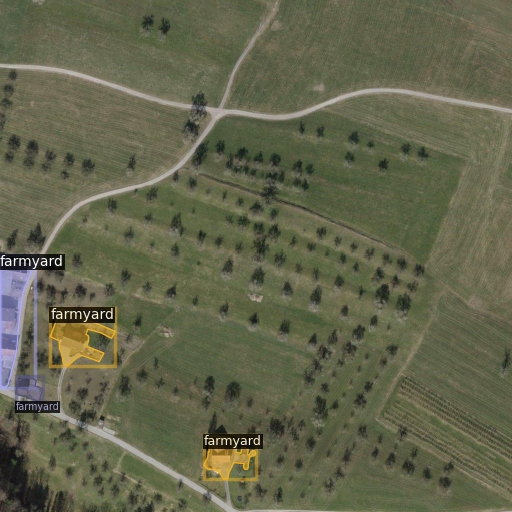

In [ ]:
# This box can be executed several times to quickly obtain an overview of the
# images that have just been trained

counter = counter + 1
print(imagefiles[counter])
Image(imagefiles[counter])


# Inference
The art of making predictions with our new model!

## Adaptation to the model with the lowest validation loss



1. look in Tensorboard under the scalar val_loss to see at which time the model had the lowest validation loss.
2. here it generalizes best on the test data and is not yet in an overfitting on the training data!
3. note the "Step" value that is displayed at the minimum of the curve (e.g. 349)
4. open config_ch.yaml
5. under section "make_predictions" find the variable "pth_file"
6. look in the logs folder to see which files can be found there
7. localize the file with your step value, e.g. model_0000349.pth
8. replace the file path in the config YAML with the new pth_file path so that it now contains the following, for example:
```
    model_weights:
        pth_file: './logs/model_0000349.pth'
```
9. do not forget to save with Ctrl+S
10. if you do not make this adjustment, a less optimal model from step 500 will be used (model_final.pth), which may already be overfitted.


### Warum dieser Prozess wichtig ist

Wenn ihr ein neuronales Netz trainiert, verändert es bei jedem „Step“ (Trainingsschritt) seine Gewichte, um die Fehler auf den Trainingsdaten zu verringern. Dabei passiert etwas Entscheidendes: Zuerst lernt das Modell wirklich die Muster in den Daten. Nach einer Weile beginnt es aber, sich die Trainingsdaten zu merken – also auch den Zufall, das Rauschen, kleine Fehler.
→ Das nennt man Overfitting.

### Was bedeutet die „Validation Loss“-Kurve?

Während des Trainings wird regelmäßig überprüft, wie gut das Modell auf den Validierungsdaten (also unbekannten Beispielen) abschneidet. Diese val_loss zeigt also, wie gut das Modell verallgemeinert. Wenn die val_loss anfängt zu steigen, obwohl die Trainingsloss weiter sinkt → das Modell lernt zu sehr die Trainingsdaten auswendig.

### Das beste Modell ist daher dasjenige, bei dem die val_loss am niedrigsten ist!
Denn dort:
- erkennt das Modell die Daten am besten, die es noch nie gesehen hat
- ist es noch nicht overfittet, sondern hat die beste Generalisation

### Warum ihr genau dieses Modell laden müsst

Euer Training speichert regelmäßig sogenannte Checkpoints (z. B. model_0000349.pth), die den Zustand des Modells zu einem bestimmten Zeitpunkt enthalten.
Der letzte gespeicherte (model_final.pth) ist oft nicht der beste, weil das Modell da schon begonnen hat, zu overfitten.

👉 Deshalb:
- In TensorBoard nachsehen, wann die val_loss am niedrigsten war.
- Diesen Step-Wert merken (z. B. 349).
- Genau dieses Modellgewicht laden – das ist euer Best Model.


## Run Inference!

In [ ]:
# Let's use our new detector!

# With this step we perform the prediction on known and unknown data.

!python scripts/make_predictions.py config_ch.yaml


2025-10-17 09:03:10,094 - root - INFO - Starting...
2025-10-17 09:03:10,095 - root - INFO - Using config_ch.yaml as config file.
[10/17 09:03:10 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./logs/model_final.pth ...
2025-10-17 09:03:10,990 - fvcore.common.checkpoint - INFO - [Checkpointer] Loading from ./logs/model_final.pth ...
2025-10-17 09:03:11,369 - root - INFO - Making predictions over the entire trn dataset...
  0% 0/71 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4322.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100% 71/71 [00:07<00:00,  9.65it/s]
2025-10-17 09:03:18,778 - root - INFO - ...done.
2025-10-17 09:03:18,778 - root - INFO - Let's tag some sample images...
2025-10-17 09:03:20,804 - root - INFO - ...done.

## Some Post-Inference Checks

In [ ]:
# We check whether everything has worked and display a few labels.
import glob
from IPython.display import Image
imagefiles = glob.glob('output_CH/sample_prediction_images/*pred*.png')
counter = -1

output_CH/sample_prediction_images/oth_pred_16_34416_22880.png


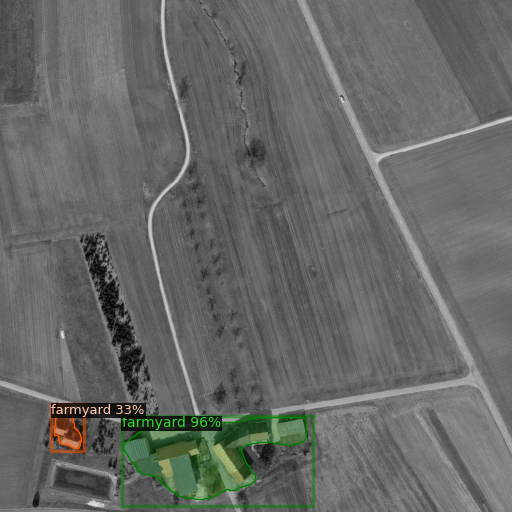

In [ ]:
# This box can be executed several times to quickly obtain an overview of the
# images that have just been predicted!
counter = counter + 1
print(imagefiles[counter])
Image(imagefiles[counter])


# Evaluation

In [ ]:
# Now we are ready - the model is trained and the predictions are generated as
# pickle files. With the assessment script we can calculate relevant
# metrics for our model and generate our tagged_predictions GEOJSON
# - the result of our work.

# The most important metrics can then be found in the HTML file tst_metrics

import warnings
warnings.filterwarnings("ignore")

!python scripts/assess_predictions.py config_ch.yaml

2025-10-17 09:04:42,750 - root - INFO - Starting...
2025-10-17 09:04:42,751 - root - INFO - Using config_ch.yaml as config file.
2025-10-17 09:04:42,756 - root - INFO - Loading split AoI tiles as a GeoPandas DataFrame...
2025-10-17 09:04:42,830 - root - INFO - ...done. 535 records were found.
2025-10-17 09:04:42,830 - root - INFO - Loading Ground Truth Labels as a GeoPandas DataFrame...
2025-10-17 09:04:42,838 - root - INFO - ...done. 121 records were found.
2025-10-17 09:04:42,838 - root - INFO - Loading Other Labels as a GeoPandas DataFrame...
2025-10-17 09:04:42,840 - root - INFO - ...done. 1 records were found.
2025-10-17 09:04:42,841 - root - INFO - Clipping labels...
2025-10-17 09:04:42,912 - pyogrio._io - INFO - Created 173 records
2025-10-17 09:04:42,912 - root - INFO - ...done. Elapsed time = 0.07 seconds.
2025-10-17 09:04:43,090 - root - INFO - Extracting vector features...
Current dataset: trn:   0% 0/4 [00:00<?, ?it/s]2025-10-17 09:04:44,221 - pyogrio._io - INFO - Created 1

## Interpretation

Was hier passiert ist:

Das Skript lädt alle benötigten Daten
Es liest eure Ground Truth Labels (also die echten Objekte), Predictions (was das Modell erkannt hat) und AoI-Tiles (Gebietsaufteilung).

Es testet viele verschiedene Confidence Thresholds. Hier seht ihr viele Zeilen wie:
`Threshold = 0.05, Threshold = 0.10, Threshold = 0.15, …`
Das bedeutet: das Skript überprüft bei welchem Confidence-Schwellwert (also wie sicher das Modell bei einer Erkennung ist) die Erkennungen am besten mit den echten Labels übereinstimmen.
Ein niedriger Threshold (0.05) → zeigt viele richtige Treffer, aber auch viele falsch-positive.
Ein hoher Threshold (0.9) → zeigt weniger Treffer, aber fast nur sichere.
Ziel: Das beste Gleichgewicht zwischen Präzision (precision) und Trefferquote (recall) zu finden. hierfür berechnet es auch den F1-Score für jeden Threshold.
Der F1-Score ist der harmonische Mittelwert aus Präzision und Recall.
Das Skript sucht den Threshold, bei dem der F1-Score am höchsten ist.

In eurer Ausgabe steht z.B.:
```
Tagging predictions with threshold = 0.20, which maximizes the f1-score on the val dataset.
```
→ Bedeutet: Bei Confidence 0.20 ist das Modell am ausgewogensten zwischen „zu viele Falschmeldungen“ und „zu viele übersehene Objekte“. Der Validation-Datensatz (val) ist der Teil eurer Daten, den das Modell noch nicht gesehen hat, aber der repräsentativ für eure echten Einsatzbedingungen ist. Der F1-optimale Threshold (hier 0.20) sorgt also dafür, dass ihr in QGIS nur die Detektionen anzeigt, bei denen das Modell im Schnitt die beste Balance zwischen zu vielen und zu wenigen Erkennungen erreicht. Wenn ihr diesen Wert als Filter in QGIS verwendet (z. B. confidence >= 0.20), seht ihr die realistisch besten Vorhersagen – also das, was das Modell „guten Gewissens“ erkannt hat.

## Ready for Export

In [ ]:
# With the following line we merge all relevant detections to enable a
# complete representation in the GIS.

In [ ]:
!ogrmerge.py -single -f GPKG -o merged_detections.gpkg output_CH/assessment/trn_predictions.geojson output_CH/assessment/tst_predictions.geojson output_CH/assessment/val_predictions.geojson -src_layer_field_name dataset

In [ ]:
# Create a backup with
#!zip -r backup.zip data detectron2 helpers scripts *.yaml *.txt

  adding: data/ (stored 0%)
  adding: data/buildings_minbuf.cpg (stored 0%)
  adding: data/prediction_labels.shp (deflated 60%)
  adding: data/buildings_minbuf.dbf (deflated 99%)
  adding: data/aoi.prj (deflated 40%)
  adding: data/aoi.dbf (deflated 87%)
  adding: data/labels_hofraum.shp (deflated 31%)
  adding: data/inference-muttenz.cpg (stored 0%)
  adding: data/inference-muttenz.prj (deflated 40%)
  adding: data/labels_hofraum.dbf (deflated 99%)
  adding: data/prediction_labels.shx (deflated 49%)
  adding: data/inference-muttenz.qmd (deflated 52%)
  adding: data/labels_hofraum.shx (deflated 43%)
  adding: data/prediction_labels.prj (deflated 40%)
  adding: data/aoi.shx (deflated 46%)
  adding: data/aoi.shp (deflated 28%)
  adding: data/aoi.cpg (stored 0%)
  adding: data/prediction_labels.dbf (deflated 67%)
  adding: data/inference-muttenz.dbf (deflated 57%)
  adding: data/aoi.qmd (deflated 52%)
  adding: data/inference-muttenz.shp (deflated 50%)
  adding: data/buildings_minbuf.prj 

In [ ]:
# Connect with your Google Drive, follow instructions.
# from google.colab import drive

In [ ]:
# Mount Google drive as a folder on your virtual machine:
# drive.mount('/content/drive', force_remount=True)

In [ ]:
# Copy to Google Drive:
#!cp merged_detections.gpkg "/content/drive/My Drive/merged_detections.gpkg"

In [ ]:
#while True:pass